### Imports

In [1]:
import os
from os.path import join
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler

### Read Data

In [2]:
drive.mount("/content/drive/")
directory="/content/drive/MyDrive/data"

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [3]:
files = [f for f in os.listdir(directory) if os.path.isfile(join(directory, f))]
files

['R1400.xlsx',
 'U1400.xlsx',
 'R99.xlsx',
 'U99.xlsx',
 'R1401.xlsx',
 'U1401.xlsx',
 'R98.xlsx',
 'U98.xlsx']

In [ ]:
all_files = {}

for file_name in files:
    file_path = join(directory, file_name)
    with pd.ExcelFile(file_path) as excel_file:
        sheets = {sheet: pd.read_excel(excel_file, sheet) for sheet in excel_file.sheet_names}
    all_files[file_name.split('.')[0]] = sheets

In [ ]:
for file_name, sheets in all_files.items():
    print(f"File: {file_name}")
    for sheet_name, data in sheets.items():
        print(f"  Sheet: {sheet_name}, Data shape: {data.shape}")

### PreProcessing

In [6]:
cost_sheets = ["P3S01", "P3S02", "P3S03", "P3S04", "P3S05", "P3S06", "P3S07",
               "P3S08", "P3S09", "P3S10","P3S11","P3S12","P3S13",]
income_sheets = ["P4S01", "P4S02", "P4S03", "P4S04"]
required_sheets = []
required_sheets.extend(cost_sheets)
required_sheets.extend(income_sheets)
required_sheets

['P3S01',
 'P3S02',
 'P3S03',
 'P3S04',
 'P3S05',
 'P3S06',
 'P3S07',
 'P3S08',
 'P3S09',
 'P3S10',
 'P3S11',
 'P3S12',
 'P3S13',
 'P4S01',
 'P4S02',
 'P4S03',
 'P4S04']

In [7]:
required_dfs = {}
for f, sheets in all_files.items():
    required_dfs[f] = {}
    for sheet, df in sheets.items():
        for required_sheet in required_sheets:
            if required_sheet in sheet:
                required_dfs[f][required_sheet] = df
                required_dfs[f][required_sheet]["file"] = f

for f, sheets in required_dfs.items():
    for sheet, df in sheets.items():
        print(f)
        # if sheet == "Data":
        print(f"{sheet} : {df.shape}")
        print("-------------------------------------")

R1400
P3S01 : (509426, 8)
-------------------------------------
R1400
P3S02 : (3621, 8)
-------------------------------------
R1400
P3S03 : (26019, 5)
-------------------------------------
R1400
P3S04 : (69396, 6)
-------------------------------------
R1400
P3S05 : (87768, 5)
-------------------------------------
R1400
P3S06 : (29465, 5)
-------------------------------------
R1400
P3S07 : (32866, 5)
-------------------------------------
R1400
P3S08 : (34928, 5)
-------------------------------------
R1400
P3S09 : (9523, 5)
-------------------------------------
R1400
P3S10 : (0, 5)
-------------------------------------
R1400
P3S11 : (9206, 5)
-------------------------------------
R1400
P3S12 : (66456, 5)
-------------------------------------
R1400
P3S13 : (180585, 4)
-------------------------------------
R1400
P4S01 : (10731, 20)
-------------------------------------
R1400
P4S02 : (12194, 20)
-------------------------------------
R1400
P4S03 : (25097, 12)
--------------------------------

In [8]:
# for sheets in required_dfs.values():
#     try:
#         sheets["P4S01"].drop(
#             sheets["P4S01"][
#                 (sheets["P4S01"]["employed_w"] == 1) &
#                 (sheets["P4S01"]["income_w_y"] <= 0) &
#                 (sheets["P4S01"]["netincome_w_y"] <= 0)
#             ].index,
#             inplace=True,
#         )
#     except Exception as e:
#         print(f"{f} ----> P4S01 ----> {e}")
#     try:
#         sheets["P4S02"].drop(
#             sheets["P4S02"][
#                 (sheets["P4S02"]["employed_s"] == 1) &
#                 (sheets["P4S02"]["sale"] <= 0) &
#                 (sheets["P4S02"]["income_s_y"] <= 0)
#             ].index,
#             inplace=True,
#         )
#     except Exception as e:
#         print(f"{f} ----> P4S02 ----> {e}")

#     try:
#         sheets["P4S03"].drop(
#             sheets["P4S03"][
#                 (sheets["P4S03"]["income_pension"] < 0) |
#                 (sheets["P4S03"]["income_rent"] < 0) |
#                 (sheets["P4S03"]["income_interest"] < 0) |
#                 (sheets["P4S03"]["income_resale"] < 0) |
#                 (sheets["P4S03"]["income_transfer"] < 0)
#             ].index,
#             inplace=True,
#         )
#     except Exception as e:
#         print(f"{f} ----> P4S03 ----> {e}")

In [9]:
overall_dfs = {}

for f in required_dfs.keys():
    for required_sheet in required_sheets:
        data = overall_dfs.get(required_sheet)
        if data is None:
            overall_dfs[required_sheet] = required_dfs[f][required_sheet]
        else:
            overall_dfs[required_sheet] = pd.concat(
                [overall_dfs[required_sheet], required_dfs[f][required_sheet]],
                axis=0,
            )

In [10]:
for k in overall_dfs.keys():
    print(f"{k} : {overall_dfs[k].shape}")

P3S01 : (4459722, 8)
P3S02 : (28325, 8)
P3S03 : (207116, 5)
P3S04 : (618958, 6)
P3S05 : (727275, 5)
P3S06 : (250916, 5)
P3S07 : (297230, 5)
P3S08 : (299383, 5)
P3S09 : (87297, 5)
P3S10 : (0, 5)
P3S11 : (94616, 5)
P3S12 : (576300, 5)
P3S13 : (1635316, 4)
P4S01 : (92393, 20)
P4S02 : (76857, 20)
P4S03 : (188752, 12)
P4S04 : (222685, 9)


In [11]:
for sheet, df in overall_dfs.items():
    print(f"duplicates of {sheet} : {df[df.duplicated(keep='first')].shape} -----> {df.shape}")

duplicates of P3S01 : (0, 8) -----> (4459722, 8)
duplicates of P3S02 : (0, 8) -----> (28325, 8)
duplicates of P3S03 : (0, 5) -----> (207116, 5)
duplicates of P3S04 : (0, 6) -----> (618958, 6)
duplicates of P3S05 : (0, 5) -----> (727275, 5)
duplicates of P3S06 : (0, 5) -----> (250916, 5)
duplicates of P3S07 : (0, 5) -----> (297230, 5)
duplicates of P3S08 : (0, 5) -----> (299383, 5)
duplicates of P3S09 : (0, 5) -----> (87297, 5)
duplicates of P3S10 : (0, 5) -----> (0, 5)
duplicates of P3S11 : (0, 5) -----> (94616, 5)
duplicates of P3S12 : (0, 5) -----> (576300, 5)
duplicates of P3S13 : (2586, 4) -----> (1635316, 4)
duplicates of P4S01 : (1, 20) -----> (92393, 20)
duplicates of P4S02 : (0, 20) -----> (76857, 20)
duplicates of P4S03 : (0, 12) -----> (188752, 12)
duplicates of P4S04 : (18, 9) -----> (222685, 9)


`P3S13`, `P4S01` and `P4S04` has duplicates and as they are low, we can drop them.

In [12]:
overall_dfs["P4S04"][overall_dfs["P4S04"].duplicated(keep=False)]

,Address,member,subsidy_number,subsidy_month,subsidy,Fasl,year,DYCOL00,file
14360,22301631723,1,1.0,12.0,1260000.0,2,1401,NaN,R1400
14361,22301631723,1,1.0,12.0,1260000.0,2,1401,NaN,R1400
14097,12301278824,1,1.0,12.0,5460000.0,2,1401,NaN,U1400
14098,12301278824,1,1.0,12.0,5460000.0,2,1401,NaN,U1400
22901,12501305132,1,1.0,12.0,1260000.0,3,1401,NaN,U1400
22902,12501305132,1,1.0,12.0,1260000.0,3,1401,NaN,U1400
30022,12301276227,1,1.0,12.0,5460000.0,4,1401,NaN,U1400
30023,12301276227,1,1.0,12.0,5460000.0,4,1401,NaN,U1400
13665,20404431220,1,NaN,12.0,NaN,3,1399,NaN,R99
13666,20404431220,1,NaN,12.0,NaN,3,1399,NaN,R99


In [13]:
overall_dfs["P4S04"].drop_duplicates(inplace=True)

In [14]:
overall_dfs["P4S01"][overall_dfs["P4S01"].duplicated(keep=False)]

,Address,member,employed_w,ISCO_w,ISIC_w,status_w,hours_w,days_w,income_w_m,income_w_y,wage_w_m,wage_w_y,perk_w_m,perk_w_y,netincome_w_m,netincome_w_y,Fasl,year,DYCOL00,file
5452,20005389220,3,2,9314.0,41000.0,3,NaN,NaN,0,40000000,0.0,40000000.0,0.0,0.0,0,40000000,3,1399,NaN,R99
5453,20005389220,3,2,9314.0,41000.0,3,NaN,NaN,0,40000000,0.0,40000000.0,0.0,0.0,0,40000000,3,1399,NaN,R99


In [15]:
overall_dfs["P4S01"].drop_duplicates(inplace=True)

In [16]:
overall_dfs["P3S13"][overall_dfs["P3S13"].duplicated(keep=False)].head(10)

,Address,code,value,file
2733,20111403626,125111,0000285000,R1400
2734,20111403626,125111,0000285000,R1400
2891,20106401035,125111,0000285000,R1400
2892,20106401035,125111,0000285000,R1400
2908,20107401527,125111,0000285000,R1400
2909,20107401527,125111,0000285000,R1400
3004,20108401935,125111,0000285000,R1400
3005,20108401935,125111,0000285000,R1400
3134,20106401023,125111,0000285000,R1400
3135,20106401023,125111,0000285000,R1400


In [17]:
overall_dfs["P3S13"].drop_duplicates(inplace=True)

In [18]:
for sheet, df in overall_dfs.items():
    print(f"duplicates of {sheet} : {df[df.duplicated(keep='first')].shape} -----> {df.shape}")

duplicates of P3S01 : (0, 8) -----> (4459722, 8)
duplicates of P3S02 : (0, 8) -----> (28325, 8)
duplicates of P3S03 : (0, 5) -----> (207116, 5)
duplicates of P3S04 : (0, 6) -----> (618958, 6)
duplicates of P3S05 : (0, 5) -----> (727275, 5)
duplicates of P3S06 : (0, 5) -----> (250916, 5)
duplicates of P3S07 : (0, 5) -----> (297230, 5)
duplicates of P3S08 : (0, 5) -----> (299383, 5)
duplicates of P3S09 : (0, 5) -----> (87297, 5)
duplicates of P3S10 : (0, 5) -----> (0, 5)
duplicates of P3S11 : (0, 5) -----> (94616, 5)
duplicates of P3S12 : (0, 5) -----> (576300, 5)
duplicates of P3S13 : (0, 4) -----> (1632730, 4)
duplicates of P4S01 : (0, 20) -----> (92392, 20)
duplicates of P4S02 : (0, 20) -----> (76857, 20)
duplicates of P4S03 : (0, 12) -----> (188752, 12)
duplicates of P4S04 : (0, 9) -----> (222667, 9)


In [19]:
required_features = {
    "P3S" : ["address", "value", "file"],
    "P3S04" : ["address", "mortgage", "value", "file"],
    # "P3S13" : ["address", "value", "file"],
    "P4S01" : ["address", "netincome_w_y", "file"],
    "P4S02" : ["address", "income_s_y", "file"],
    "P4S03" : ["address", "income_pension", "income_rent",
               "income_interest", "income_aid", "income_resale",
               "income_transfer", "file"],
    "P4S04" : ["address", "subsidy", "file"],
}

In [20]:
for sheet, df in overall_dfs.items():
    df.columns = df.columns.str.lower()

    if sheet.startswith("P3S") and sheet != "P3S04":
        overall_dfs[sheet] = overall_dfs[sheet][required_features["P3S"]]
        numeric_cols = [col for col in required_features["P3S"] if col not in ["address", "file"]]
    else:
        overall_dfs[sheet] = overall_dfs[sheet][required_features[sheet]]
        numeric_cols = [col for col in required_features[sheet] if col not in ["address", "file"]]

    overall_dfs[sheet][numeric_cols] = overall_dfs[sheet][numeric_cols].apply(pd.to_numeric, errors="coerce")
    if sheet.startswith("P3S"):
        overall_dfs[sheet]["cost"] = overall_dfs[sheet][numeric_cols].sum(axis=1)
    elif sheet == "P4S04":
        pass
    elif sheet.startswith("P4S"):
        overall_dfs[sheet]["income"] = overall_dfs[sheet][numeric_cols].sum(axis=1)

<ipython-input-20-bf1bea71e838>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  overall_dfs[sheet][numeric_cols] = overall_dfs[sheet][numeric_cols].apply(pd.to_numeric, errors="coerce")
<ipython-input-20-bf1bea71e838>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  overall_dfs[sheet]["cost"] = overall_dfs[sheet][numeric_cols].sum(axis=1)
<ipython-input-20-bf1bea71e838>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] 

In [21]:
overall_dfs["P4S01"][overall_dfs["P4S01"]["netincome_w_y"] <= 0]

,address,netincome_w_y,file,income
936,21012510235,0,R1400,0
1262,21404548723,0,R1400,0
1282,21404548720,0,R1400,0
2361,22712674726,0,R1400,0
2874,20303418020,0,R1400,0
...,...,...,...,...
11549,11904224517,0,U98,0
11669,12105245623,0,U98,0
11946,12321293808,0,U98,0
12018,12301280611,0,U98,0


In [22]:
costs = []
incomes = []
# subsid_df = overall_dfs.pop("P4S04")
for sheet, df in overall_dfs.items():
    if sheet.startswith("P3S"):
        costs.append(df[["address", "cost", "file"]])
    elif sheet == "P4S04":
        subsids_df = df.copy()
    elif sheet.startswith("P4S"):
        incomes.append(df[["address", "income", "file"]])

costs_df = pd.concat(costs).groupby(["address", "file"], as_index=False).sum("cost")
incomes_df = pd.concat(incomes).groupby(["address", "file"], as_index=False).sum("income")

In [23]:
costs_df.head(10)

,address,file,cost
0,10001000108,U98,152193000.0
1,10001000111,U98,208140288.0
2,10001000113,U99,243967000.0
3,10001000114,U98,43402000.0
4,10001000116,U99,314822000.0
5,10001000117,U98,89418000.0
6,10001000119,U1400,192519000.0
7,10001000120,U1400,847235000.0
8,10001000120,U98,59097000.0
9,10001000120,U99,289044000.0


In [24]:
incomes_df.head(10)

,address,file,income
0,10001000108,U98,3.920000e+08
1,10001000111,U98,5.640000e+08
2,10001000113,U99,8.880000e+08
3,10001000114,U98,1.440000e+08
4,10001000116,U99,6.540000e+08
5,10001000117,U98,4.440000e+08
6,10001000119,U1400,9.055000e+08
7,10001000120,U1400,1.373500e+09
8,10001000120,U98,3.330000e+08
9,10001000120,U99,9.760000e+08


In [25]:
subsids_df.head(10)

,address,subsidy,file
0,20001384225,1960000.0,R1400
1,20001384225,10920000.0,R1400
2,20001384232,1960000.0,R1400
3,20001384232,10920000.0,R1400
4,20001384235,1960000.0,R1400
5,20001384235,5460000.0,R1400
6,20011394620,1610000.0,R1400
7,20011394620,16380000.0,R1400
8,20011394623,1610000.0,R1400
9,20011394623,10920000.0,R1400


In [26]:
main_df = pd.merge(costs_df, incomes_df, on=["address", "file"])
main_df_with_subsid = pd.merge(main_df, subsids_df, on=["address", "file"])

In [27]:
main_df_with_subsid.head()

,address,file,cost,income,subsidy
0,10001000108,U98,152193000.0,392000000.0,27300000.0
1,10001000111,U98,208140288.0,564000000.0,16380000.0
2,10001000113,U99,243967000.0,888000000.0,3010000.0
3,10001000113,U99,243967000.0,888000000.0,16380000.0
4,10001000114,U98,43402000.0,144000000.0,5460000.0


In [28]:
main_df_with_subsid.fillna(0, inplace=True)

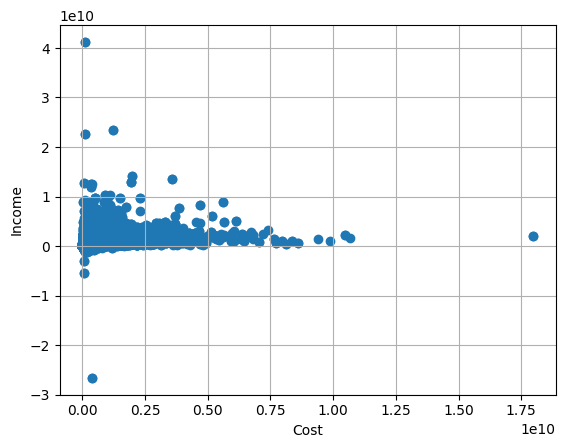

In [29]:
plt.scatter(main_df_with_subsid["cost"], main_df_with_subsid["income"])
plt.xlabel("Cost")
plt.ylabel("Income")
plt.grid()
plt.show()

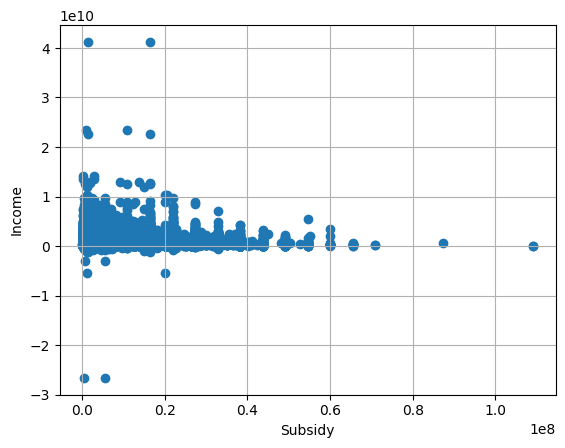

In [30]:
plt.scatter(main_df_with_subsid["subsidy"], main_df_with_subsid["income"])
plt.xlabel("Subsidy")
plt.ylabel("Income")
plt.grid()
plt.show()

As we can see there are some otliers. We can use `zscore` to handle them.

In [31]:
from scipy.stats import zscore

zscores = np.abs(zscore(main_df_with_subsid[["cost", "income", "subsidy"]]))
final_df = main_df_with_subsid[(zscores < 3).all(axis=1)]
final_df.shape
# final_df = main_df_with_subsid

(214889, 5)

In [32]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(final_df[["cost", "income", "subsidy"]])

### KMeans with k = 10

In [33]:
kmeans = KMeans(n_clusters=10, random_state=42)
kmeans.fit(x_scaled)
labels = kmeans.labels_
final_df["label"] = labels
centers = kmeans.cluster_centers_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-33-9ab5ee873d51>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df["label"] = labels


In [34]:
import plotly.express as px
import plotly.graph_objects as go

fig = px.scatter_3d(
    final_df,
    x="cost",
    y="income",
    z="subsidy",
    color=final_df["label"].astype(str),
    labels={"cost": "Cost", "income": "Income", "subsidy": "Subsidy", "color": "Cluster"},
    title="K-means Clustering with Centers of Families",
    hover_name="address",
)

center_trace = go.Scatter3d(
    x=centers[:, 0], y=centers[:, 1], z=centers[:, 2],
    mode="markers",
    marker=dict(size=10, color="black", symbol="x"),
    name="Centers",
)

fig.add_trace(center_trace)
fig.update_layout(
    margin=dict(l=0, r=0, b=0, t=0),
    scene_aspectratio=dict(x=1, y=1, z=0.9),
)
fig.show()

<ipython-input-35-2a0576e2ba14>:2: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



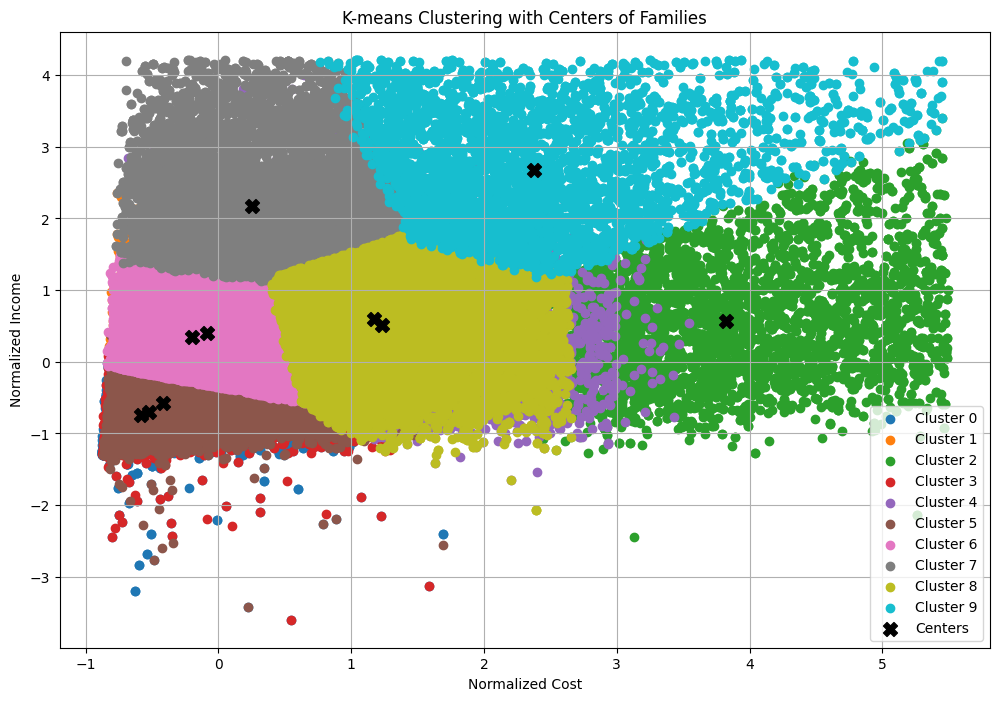

In [35]:
plt.figure(figsize=(12, 8))
colors = plt.cm.get_cmap("tab10", 10)

for i in range(10):
    plt.scatter(
        x_scaled[labels == i, 0], x_scaled[labels == i, 1],
        c=[colors(i)],
        label=f"Cluster {i}",
    )

plt.scatter(
    centers[:, 0], centers[:, 1],
    s=100,
    c="black",
    marker="X",
    label="Centers",
)

plt.title("K-means Clustering with Centers of Families")
plt.xlabel("Normalized Cost")
plt.ylabel("Normalized Income")
plt.legend()
plt.grid(True)
plt.show()

In [36]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

inertia = kmeans.inertia_

silhouette = silhouette_score(x_scaled, kmeans.labels_)
ch_score = calinski_harabasz_score(x_scaled, kmeans.labels_)

print("Inertia:", inertia)
print("Silhouette Score:", silhouette)
print("Calinski-Harabasz Score:", ch_score)

Inertia: 118350.89388496557
Silhouette Score: 0.3351873672845207
Calinski-Harabasz Index: 106177.69068530471


### Best k with WCSS

ch score for 2 : 114646.82039566088
ch score for 3 : 135068.56925119582
ch score for 4 : 132165.37499302073
ch score for 5 : 116206.35250978633
ch score for 6 : 111546.54400330379
ch score for 7 : 115643.07280064974
ch score for 8 : 109924.35481375163
ch score for 9 : 109206.24743908043
ch score for 10 : 106052.5100347403
ch score for 11 : 103742.14985240159
ch score for 12 : 100315.82045762327
ch score for 13 : 95649.58284108073
ch score for 14 : 94201.8548970234
ch score for 15 : 93145.50780623352
ch score for 16 : 94164.64650095247
ch score for 17 : 92877.77161515223
ch score for 18 : 91037.25946355662
ch score for 19 : 90550.01878460465
ch score for 20 : 89891.11758538226


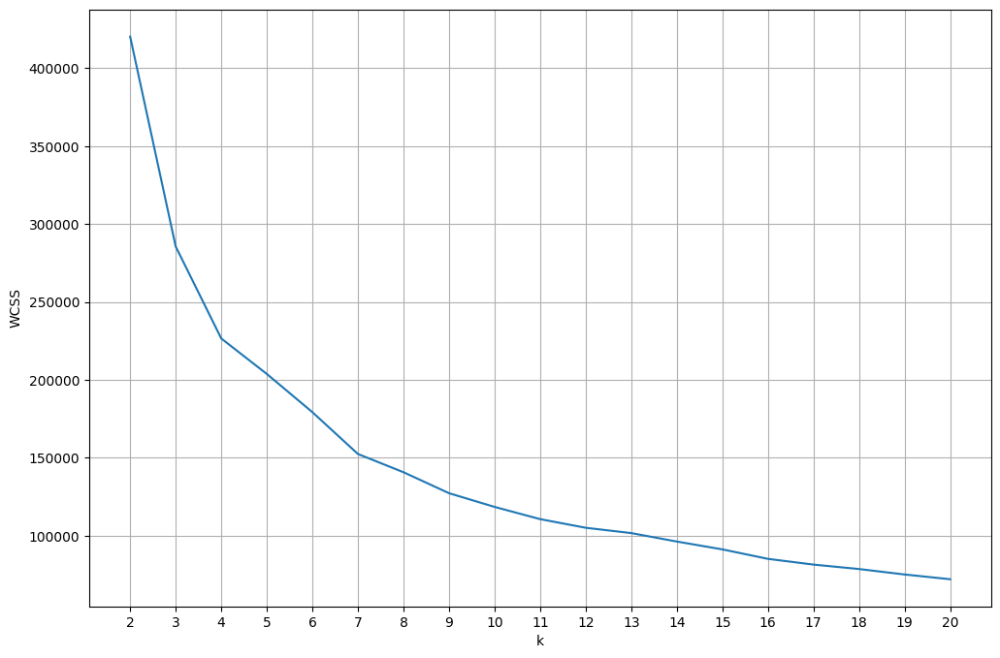

In [37]:
wcss = []
k_values = range(2, 21)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init="auto")
    kmeans.fit(x_scaled)
    wcss.append(kmeans.inertia_)
    print(f"ch score for {k} : {calinski_harabasz_score(x_scaled, kmeans.labels_)}")

plt.figure(figsize=(12, 8))
plt.plot(k_values, wcss)
plt.xlabel("k")
plt.ylabel("WCSS")
plt.xticks(k_values)
plt.grid(True)
plt.show()

The elbow point and the highest `calinski_harabasz_score` is with `k = 3`.

### DBSCAN

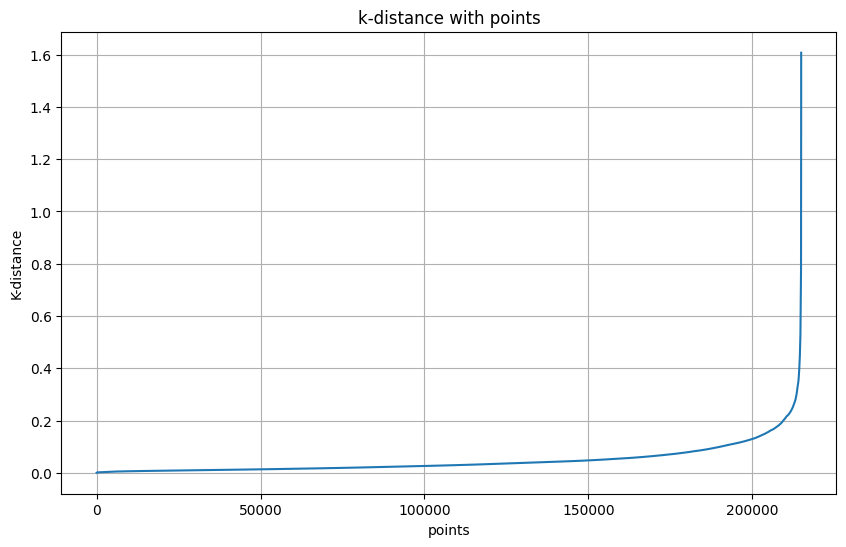

In [38]:
from sklearn.neighbors import NearestNeighbors

neigh = NearestNeighbors(n_neighbors=10)
nbrs = neigh.fit(x_scaled)
distances, indices = nbrs.kneighbors(x_scaled)
distances = np.sort(distances[:, -1], axis=0)

plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title("k-distance with points")
plt.xlabel("points")
plt.ylabel("K-distance")
plt.grid()
plt.show()

In [39]:
!pip install kneed

In [40]:
from kneed import KneeLocator

kneedle = KneeLocator(range(len(distances)), distances, S=1.0, curve="convex", direction="increasing")
eps = distances[kneedle.elbow]
print(f"Knee point: {eps}")

Knee point: 0.42186290422649614


In [44]:
from sklearn.preprocessing import Normalizer

normalizer = Normalizer()
x_normalized = normalizer.fit_transform(final_df[["cost", "income", "subsidy"]])

In [ ]:
eps = 0.35
min_samples = 3 * x_normalized.shape[1]

dbscan = DBSCAN(eps=eps, min_samples=min_samples)
dbscan.fit(x_normalized)
labels_dbscan = dbscan.labels_
final_df["label_dbscan"] = labels_dbscan

In [42]:
fig = px.scatter_3d(final_df,
                    x="cost",
                    y="income",
                    z="subsidy",
                    color=final_df["label_dbscan"].astype(str),
                    labels={"x": "Cost", "y": "Income", "z": "Subsidy", "color": "Cluster"},
                    title="DBSCAN",
                    )
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

In [43]:
n_clusters = len(set(labels_dbscan)) - (1 if -1 in labels_dbscan else 0)
n_noise = list(labels_dbscan).count(-1)
print(f"Number of Clusters : {n_clusters}")
print(f"Number of Noise Points: {n_noise}")